In [1]:
import os
os.chdir('..')
os.getcwd()

'/Users/signapoop/Desktop/fyp-graph-clustering'

In [2]:
import matplotlib.pyplot as plt

import pickle 
import numpy as np
import pandas as pd
import torch
import os

In [3]:
from core.GraphConvNet import GraphConvNet
from core.EmbeddingDataSet import EmbeddingDataSet
from core.GraphDataBlock import GraphDataBlock
from util.plot_graph_embedding import plot_graph_embedding
from util.plot_embedding import plot_embedding
from util.network_utils import get_net_projection

cuda not available


In [4]:
if torch.cuda.is_available():
    dtypeFloat = torch.cuda.FloatTensor
    dtypeLong = torch.cuda.LongTensor
    print('cuda available')
    device = 'cuda'
else:
    dtypeFloat = torch.FloatTensor
    dtypeLong = torch.LongTensor
    print('cuda not available')
    device = 'cpu'

cuda not available


## Cora viz

In [5]:
dataset_name = 'cora_test'
parent_dir = os.path.abspath('..')
input_dir = os.path.join(parent_dir, 'data')
dataset = EmbeddingDataSet(dataset_name, input_dir, train=True)
dataset.create_all_data(n_batches=1, shuffle=False)
dataset.summarise()

Data blocks of length:  [2708]
Time to create all data (s) = 0.0494
Name of dataset = cora_test
Input dimension = 1433
Number of training samples = 2708
Training labels = True


In [6]:
net_parameters = {}
net_parameters['n_components'] = 2
net_parameters['D'] = dataset.input_dim # input dimension
net_parameters['L'] = 2 # number of hidden layers

In [7]:
from sklearn.manifold import TSNE
embedder = TSNE(n_components=2, metric='cosine', perplexity=30, verbose=1)
y_tsne_cora = embedder.fit_transform(dataset.inputs.toarray())

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2708 samples in 0.002s...
[t-SNE] Computed neighbors for 2708 samples in 0.428s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2708
[t-SNE] Computed conditional probabilities for sample 2000 / 2708
[t-SNE] Computed conditional probabilities for sample 2708 / 2708
[t-SNE] Mean sigma: 0.193958
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.141365
[t-SNE] KL divergence after 1000 iterations: 2.494384


In [8]:
# Graph net
def load_net_from_root(root, net_parameters):
    net_parameters['H'] = 128 # number of hidden units
    net_1 = GraphConvNet(net_parameters)
    if torch.cuda.is_available(): net_1.cuda()
    filename = os.path.join(root, 'graph_net_360.pkl')
    checkpoint = torch.load(filename, map_location=device)
    net_1.load_state_dict(checkpoint['state_dict'])
    return net_1

In [9]:
main_dir = os.path.join('results', 'cora_fourth_test')
main_dir

'results/cora_fourth_test'

In [10]:
net = load_net_from_root(main_dir+'/cora_test_5', net_parameters)
y_net_cora = get_net_projection(net, dataset)

Data blocks of length:  [2708]
Time to create all data (s) = 0.0297


## Mnist with t-SNE

In [11]:
from util.mnist_data_loader import get_train_set, get_test_set
from util.draw_random_subset import draw_random_subset

In [12]:
data_dir = parent_dir + '/data/mnist/'
data_dir

'/Users/signapoop/Desktop/data/mnist/'

In [13]:
train_set = get_train_set(data_dir, augment=True)
len(train_set)

60000

In [14]:
n = 5000
inputs, labels = draw_random_subset(train_set, n)

In [15]:
X_unrolled = inputs.view(inputs.shape[0], -1).numpy()
X_unrolled.shape

(5000, 784)

In [16]:
from sklearn.manifold import TSNE
embedder = TSNE(n_components=2, metric='euclidean', perplexity=30, verbose=1)
y_pred = embedder.fit_transform(X_unrolled)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.158s...
[t-SNE] Computed neighbors for 5000 samples in 29.796s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 6.366162
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.281601
[t-SNE] KL divergence after 1000 iterations: 1.561663


In [47]:
legend_size = 11
title_size = 16

In [48]:
import numpy as np
import scipy.sparse as sp
from bokeh.palettes import Category20_20, Category20b_20, Accent8
from matplotlib import collections  as mc
import matplotlib.pyplot as plt


def plot_graph_embedding(y_emb, labels, adj, line_alpha=0.1, s=3, ax=None, title="", margin=0.1):
    """
    Plots the visualization of graph-structured data
    Args:
        y_emb (np.array): low dimensional map of data points, matrix of size n x 2
        labels (np.array): underlying class labels, matrix of size n x 1
        adj (np.array): adjacency matrix
    """
    labels = np.array([int(l) for l in labels])
    adj = sp.coo_matrix(adj)

    colormap = np.array(Category20_20 + Category20b_20 + Accent8)

    if ax is None:
        f, ax = plt.subplots(1, sharex='col', figsize=(10, 8), dpi=300)
    else:
        ax.set_axis_off()

    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_title(title, fontsize=title_size)

    # Plot edges
    p0 = y_emb[adj.row, :]
    p1 = y_emb[adj.col, :]
    p_0 = [tuple(row) for row in p0]
    p_1 = [tuple(row) for row in p1]

    classA = labels[adj.row]
    classB = labels[adj.col]
    mask = classA == classB
    edge_colormask = mask * (classA + 1) - 1

    lines = list(zip(p_0, p_1))
    lc = mc.LineCollection(lines, linewidths=0.5, colors=colormap[edge_colormask])
    lc.set_alpha(line_alpha)
    ax.add_collection(lc)

    ax.scatter(y_emb[:, 0], y_emb[:, 1], s=s, c=colormap[labels])

    plt.autoscale(tight=True)
    ax.margins(margin, margin)
    plt.tight_layout()

In [37]:
def plot_embedding(y_emb, labels, s=3, ax=None, title=""):
    labels = np.array([int(l) for l in labels])

    colormap = np.array(Category20_20 + Category20b_20 + Accent8)

    if ax is None:
        f, ax = plt.subplots(1, sharex='col', figsize=(10, 8), dpi=300)
    else:
        ax.set_axis_off()

    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_title(title, fontsize = title_size)

    ax.scatter(y_emb[:, 0], y_emb[:, 1], s=s, c=colormap[labels])

    plt.autoscale(tight=True)
    ax.margins(margin, margin)
    plt.tight_layout()

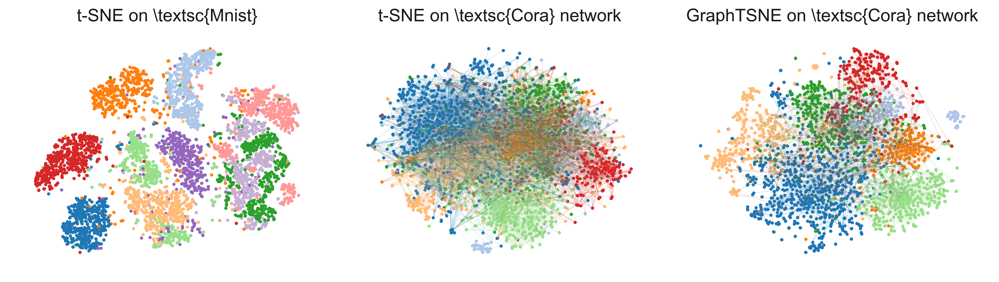

In [20]:
f, axarr = plt.subplots(1, 3, figsize=(12, 3.5), dpi=400)

import seaborn as sns
sns.set()

plt.rc('text', usetex=True)
plt.rc('font', family='serif')

plot_embedding(y_pred, labels, ax=axarr[0], title=r't-SNE on \textsc{Mnist}')
plot_graph_embedding(y_tsne_cora, dataset.labels, dataset.adj_matrix, ax=axarr[1], title=r't-SNE on \textsc{Cora} network')
plot_graph_embedding(y_net_cora, dataset.labels, dataset.adj_matrix, ax=axarr[2], title=r'GraphTSNE on \textsc{Cora} network')
plt.tight_layout()
plt.savefig('motivation.pdf', format='pdf', dpi=1000, bbox_inches="tight")

In [21]:
from scipy.sparse.csgraph import connected_components
from sklearn.manifold.spectral_embedding_ import _graph_connected_component

In [22]:
component_mask = _graph_connected_component(dataset.adj_matrix, 0)
len(component_mask)

2708

In [23]:
from util.graph_utils import get_shortest_path_matrix
path_lengths = get_shortest_path_matrix(dataset.adj_matrix)
path_lengths.shape

(2708, 2708)

In [24]:
from numpy import inf
affinity_matrix = 1/path_lengths
affinity_matrix[affinity_matrix == inf] = 0

/Users/signapoop/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  


In [25]:
from sklearn.manifold import SpectralEmbedding
le_embedder = SpectralEmbedding(n_components=2)
y_le_cora = le_embedder.fit_transform(affinity_matrix)

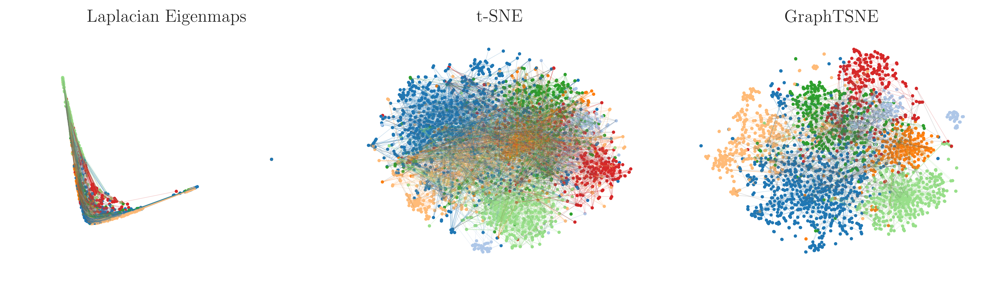

In [26]:
f, axarr = plt.subplots(1, 3, figsize=(12, 3.5), dpi=400)
plot_graph_embedding(y_tsne_cora, dataset.labels, dataset.adj_matrix, ax=axarr[1], title=r't-SNE')
plot_graph_embedding(y_net_cora, dataset.labels, dataset.adj_matrix, ax=axarr[2], title=r'GraphTSNE')
plot_graph_embedding(y_le_cora, dataset.labels, dataset.adj_matrix, ax=axarr[0], title=r'Laplacian Eigenmaps')
plt.tight_layout()
plt.savefig('motivation_headers.pdf', format='pdf', dpi=1000, bbox_inches="tight")

In [27]:
from util.plot_bokeh_embedding import plot_bokeh_embedding
plot_bokeh_embedding(y_le_cora, dataset.labels, dataset.adj_matrix)

In [28]:
np.max(y_le_cora, axis=0)

array([0.00377328, 0.00325123])

In [29]:
y_le_cora

array([[-1.70342873e-04, -9.26067777e-04],
       [-3.61723388e-04, -7.25741233e-04],
       [-6.43890954e-04,  1.54694138e-04],
       ...,
       [-7.60301805e-04,  1.93007921e-03],
       [-2.71755640e-04,  7.33751357e-06],
       [-1.72731728e-04, -9.30793567e-04]])

In [30]:
mask = y_le_cora[:,0] < 0.002
len(mask)

2708

In [31]:
y_emb = y_le_cora[mask]
new_labels = dataset.labels[mask]
new_adj = dataset.adj_matrix[mask,:][:,mask]

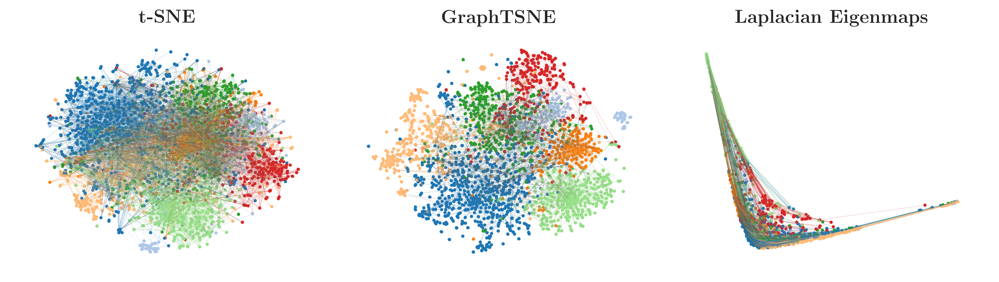

In [57]:
f, axarr = plt.subplots(1, 3, figsize=(12, 3.5), dpi=400)
plot_graph_embedding(y_tsne_cora, dataset.labels, dataset.adj_matrix, ax=axarr[0], title=r'\textbf{t-SNE}')
plot_graph_embedding(y_net_cora, dataset.labels, dataset.adj_matrix, ax=axarr[1], title=r'\textbf{GraphTSNE}')
plot_graph_embedding(y_emb, new_labels, new_adj, ax=axarr[2], title=r'\textbf{Laplacian Eigenmaps}', margin=0.1)
#plot_graph_embedding(y_le_cora, dataset.labels, dataset.adj_matrix, ax=axarr[2], title=r'Laplacian Eigenmaps')
plt.tight_layout()
plt.savefig('motivation.pdf', format='pdf', dpi=400, bbox_inches="tight")
plt.savefig('motivation_1.pdf', format='pdf', dpi=100, bbox_inches="tight")